In [20]:
import json
import pandas as pd
import glob
from datetime import datetime

def json_to_dic(json_data: dict, domain_type: str, Domain: str, date: datetime, id_: int):
    """
    Converts a JSON object containing PCAP data into a list of dictionaries for DataFrame creation.

    Args:
        json_data (dict): The JSON object representing the PCAP data.
        Domain (str): The Domain corresponding to the folder.
        date (datetime): The date extracted from the filename.
        id_ (int): The ID extracted from the filename.

    Returns:
        list[dict]: List of dictionaries containing the extracted data.
    """
    data = []
    for pcap_file, pcap_data in json_data.items():
        packet_counts = []
        sent_count = 0
        received_count = 0
        for order in pcap_data["order"]:
            if order == 1:
                packet_counts.append(pcap_data['sent'][sent_count])  # Positive for sent
                sent_count += 1
            else:
                packet_counts.append(-pcap_data['received'][received_count])  # Negative for received
                received_count += 1

        print("packet count length: ", len(packet_counts))
        if (len(packet_counts) == 0):
            continue
        data.append({
            domain_type: Domain,
            "Date": date,
            "ID": id_,
            "Website": int(pcap_file[:-5]),
            "Packet Counts": packet_counts,
        })
    return data

domain_type = 'Location'
folders = ['LOC2', 'LOC3']
concat_data = []

for folder in folders:
    for file in glob.glob(f"../dataset/{folder}/*.json"):
        # Extract date and ID from the filename
        filename = file.split("/")[-1]  # Get the filename (without path)
        date_str = filename.split("_")[0]  # Get the base name without instance
        id_str = filename.split("_")[1].split('.')[0]
        
        date_str = date_str[:8]
        print(date_str, id_str)
        date = datetime.strptime(date_str, "%d-%m-%y")  # Convert to datetime object
        id_ = int(id_str)

        with open(file, "r") as f:
            json_data = json.load(f)
            concat_data.extend(json_to_dic(json_data, domain_type,folder, date, id_))

# Create a DataFrame
df = pd.DataFrame(concat_data)

01-11-18 2
packet count length:  74
packet count length:  204
packet count length:  9
packet count length:  44
packet count length:  59
packet count length:  24
packet count length:  39
packet count length:  54
packet count length:  71
packet count length:  39
packet count length:  34
packet count length:  26
packet count length:  141
packet count length:  19
packet count length:  36
packet count length:  14
packet count length:  24
packet count length:  99
packet count length:  129
packet count length:  79
packet count length:  19
packet count length:  99
packet count length:  129
packet count length:  69
packet count length:  9
packet count length:  9
packet count length:  79
packet count length:  64
packet count length:  29
packet count length:  184
packet count length:  14
packet count length:  94
packet count length:  14
packet count length:  46
packet count length:  104
packet count length:  19
packet count length:  44
packet count length:  39
packet count length:  9
packet count

In [22]:
import pandas as pd
import numpy as np

def fix_packet_count_length(df):
    # Calculate the lengths of each "Packet Counts"
    lengths = df["Packet Counts"].apply(len)
    # Find the length at the 80th percentile
    length_80th_percentile = int(np.percentile(lengths, 80))

    print(f"length: {length_80th_percentile}")
    
    # override length 
    length_80th_percentile = 128 # this is to match the first dataset with all 3 locations
    
    # Pad the "Packet Counts" with zeros to the 80th percentile length
    df["Packet Counts"] = df["Packet Counts"].apply(
        lambda counts: counts + [0] * (length_80th_percentile - len(counts)) if len(counts) < length_80th_percentile else counts[:length_80th_percentile]
    )

    return df

# Assuming you have a DataFrame named df
df = fix_packet_count_length(df)

print(df)


length: 129
       Location       Date  ID  Website  \
0          LOC2 2018-11-01   2     1433   
1          LOC2 2018-11-01   2      294   
2          LOC2 2018-11-01   2      560   
3          LOC2 2018-11-01   2      356   
4          LOC2 2018-11-01   2      742   
...         ...        ...  ..      ...   
466876     LOC3 2018-11-23   8     1421   
466877     LOC3 2018-11-23   8     1453   
466878     LOC3 2018-11-23   8      989   
466879     LOC3 2018-11-23   8     1062   
466880     LOC3 2018-11-23   8      902   

                                            Packet Counts  
0       [88, 94, -64, 88, 33, 33, -33, -340, -33, 43, ...  
1       [88, 94, -64, 62, 33, 33, -33, -267, -33, 43, ...  
2       [-64, 88, 94, 65, 33, 33, -33, -273, -33, 0, 0...  
3       [-64, 88, 94, 60, 33, 33, -33, -330, -33, 43, ...  
4       [88, -64, 94, 68, 33, 33, -33, -275, -33, 43, ...  
...                                                   ...  
466876  [-64, 88, 94, 69, 33, 33, -33, -277, -33, 4

In [23]:
import pandas as pd

# Assume df is your original DataFrame
# Expanding the Packet Counts column into a DataFrame
packet_counts_expanded = pd.DataFrame(df['Packet Counts'].tolist())

# Renaming the columns with a range from 0 to the max length of the lists in Packet Counts
packet_counts_expanded.columns = [str(i) for i in range(packet_counts_expanded.shape[1])]

# Concatenating the expanded packet counts back to the original DataFrame
df_expanded = pd.concat([df.drop(columns=['Packet Counts']), packet_counts_expanded], axis=1)

# Display the expanded DataFrame
print(df_expanded)


       Location       Date  ID  Website   0   1   2   3   4   5  ...  118  \
0          LOC2 2018-11-01   2     1433  88  94 -64  88  33  33  ...    0   
1          LOC2 2018-11-01   2      294  88  94 -64  62  33  33  ... -141   
2          LOC2 2018-11-01   2      560 -64  88  94  65  33  33  ...    0   
3          LOC2 2018-11-01   2      356 -64  88  94  60  33  33  ...    0   
4          LOC2 2018-11-01   2      742  88 -64  94  68  33  33  ...    0   
...         ...        ...  ..      ...  ..  ..  ..  ..  ..  ..  ...  ...   
466876     LOC3 2018-11-23   8     1421 -64  88  94  69  33  33  ...    0   
466877     LOC3 2018-11-23   8     1453 -64  88  94  73  33  33  ...  -33   
466878     LOC3 2018-11-23   8      989 -64  88  94  68  33  33  ...    0   
466879     LOC3 2018-11-23   8     1062 -64  88  94  71  33  33  ...   33   
466880     LOC3 2018-11-23   8      902 -64  88  94  68  33  33  ...    0   

        119  120  121  122  123  124  125  126  127  
0         0    0    0

In [24]:
df_expanded.sort_values(by=['Location', 'Website'], inplace=True)
# df_expanded.to_csv('../dataset/processed/Locations.csv', index=False)
df_expanded.to_csv('../dataset/processed/LOC2-LOC3-Date-ID.csv', index=False)

In [25]:
df_expanded.describe()

,Date,ID,Website,0,1,2,3,4,5,6,...,118,119,120,121,122,123,124,125,126,127
count,466881,466881.000000,466881.0000,466881.000000,466881.000000,466881.000000,466881.000000,466881.000000,466881.000000,466881.000000,...,466881.000000,466881.000000,466881.000000,466881.000000,466881.000000,466881.000000,466881.000000,466881.000000,466881.000000,466881.000000
mean,2018-11-07 00:55:43.995578880,8.416781,738.1603,3.882295,32.093778,53.625643,62.596788,36.533476,35.194891,-21.774718,...,-5.538521,-4.077840,-4.203174,-0.978888,-10.527222,-5.084889,-3.910433,-3.721385,-0.726176,-10.256012
min,2018-10-18 00:00:00,0.000000,0.0000,-222.000000,-278.000000,-198.000000,-160.000000,-171.000000,-288.000000,-528.000000,...,-501.000000,-547.000000,-570.000000,-572.000000,-622.000000,-578.000000,-588.000000,-586.000000,-598.000000,-623.000000
25%,2018-10-29 00:00:00,4.000000,360.0000,-64.000000,-40.000000,57.000000,60.000000,33.000000,33.000000,-33.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2018-11-01 00:00:00,7.000000,732.0000,-1.000000,88.000000,94.000000,64.000000,33.000000,33.000000,-33.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2018-11-21 00:00:00,12.000000,1113.0000,88.000000,88.000000,94.000000,71.000000,33.000000,33.000000,-25.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2018-11-25 00:00:00,23.000000,1499.0000,88.000000,94.000000,99.000000,99.000000,94.000000,94.000000,94.000000,...,116.000000,116.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000
std,NaN,5.953217,433.8293,68.434778,69.654865,65.216719,23.393386,33.181805,17.424077,38.103296,...,45.910962,46.110055,49.907415,38.804952,59.375893,44.799260,45.922684,49.078780,38.316219,60.452803


In [39]:
def undersample(df, sample_size=200):
    # Group the DataFrame by "Location"
    grouped_df = df.groupby(["Location", "Website"])

    # Randomly sample a specified number of rows from each group
    undersampled_df = grouped_df.apply(lambda x: x.sample(min(sample_size, len(x)))).reset_index(drop=True)

    return undersampled_df

minimum_number_of_samples_per_website = df_expanded.groupby(['Location', 'Website']).size().reset_index(name='Counts').Counts.min()
df_undersampled = undersample(df_expanded.drop(columns=['Date', 'ID']), minimum_number_of_samples_per_website)

/tmp/ipykernel_340212/3542168521.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  undersampled_df = grouped_df.apply(lambda x: x.sample(min(sample_size, len(x)))).reset_index(drop=True)


In [47]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_undersampled.iloc[:, 2:] = df_undersampled.iloc[:, 2:].apply(pd.to_numeric)
df_scaled = df_undersampled.copy()
df_scaled.iloc[:, 2:] = scaler.fit_transform(df_scaled.iloc[:, 2:])

df_scaled.to_csv('../dataset/processed/LOC2-LOC3-scaled-balanced.csv', index=False)

/tmp/ipykernel_340212/1038428866.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[-0.71408863  1.40109078  1.40109078 ... -0.8315986  -0.8315986
 -0.8315986 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_scaled.iloc[:, 2:] = scaler.fit_transform(df_scaled.iloc[:, 2:])
/tmp/ipykernel_340212/1038428866.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 0.54119705  0.75289404 -1.63625774 ...  0.66216676  0.66216676
  0.66216676]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_scaled.iloc[:, 2:] = scaler.fit_transform(df_scaled.iloc[:, 2:])
/tmp/ipykernel_340212/1038428866.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 0.39192093 -2.14280105  0.5271061  ...  0.5271061   0.

In [45]:
df_scaled.iloc[:, 2:].describe()

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
count,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05,...,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05,2.970000e+05
mean,-8.268134e-17,-1.661282e-16,1.462235e-16,1.345486e-16,-4.402016e-17,-1.772290e-16,-2.641209e-17,1.324433e-16,-1.014378e-17,3.445056e-17,...,-5.454672e-18,-6.890111e-18,6.698719e-18,-1.272757e-17,-1.684249e-17,-1.837363e-17,-1.244048e-17,4.210624e-18,-2.067033e-17,2.306273e-17
std,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,...,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00
min,-2.711758e+00,-1.772349e+00,-3.156690e+00,-1.050835e+01,-3.313361e+00,-1.903904e+01,-1.262590e+01,-2.658072e+00,-1.137249e+01,-5.068214e+00,...,-1.016056e+01,-1.122720e+01,-1.117918e+01,-1.352582e+01,-1.060783e+01,-1.201942e+01,-1.213827e+01,-1.169295e+01,-1.430016e+01,-1.049046e+01
25%,-8.315986e-01,-1.273349e+00,1.384487e-01,-1.173883e-01,-1.760948e-02,-4.926006e-02,-1.773004e-01,-4.304424e-01,1.103830e-01,3.281372e-01,...,1.259857e-01,1.027696e-01,9.249530e-02,4.300365e-02,1.589042e-01,1.195061e-01,9.944467e-02,8.384269e-02,3.722573e-02,1.522160e-01
50%,-8.315986e-01,6.621668e-01,5.271061e-01,7.153832e-02,-1.760948e-02,-4.926006e-02,-1.773004e-01,-3.328172e-01,1.103830e-01,4.040086e-01,...,1.259857e-01,1.027696e-01,9.249530e-02,4.300365e-02,1.589042e-01,1.195061e-01,9.944467e-02,8.384269e-02,3.722573e-02,1.522160e-01
75%,1.401091e+00,6.621668e-01,5.271061e-01,3.549283e-01,-1.760948e-02,-4.926006e-02,-1.773004e-01,-2.706921e-01,1.103830e-01,4.040086e-01,...,1.259857e-01,1.027696e-01,9.249530e-02,4.300365e-02,1.589042e-01,1.195061e-01,9.944467e-02,8.384269e-02,3.722573e-02,1.522160e-01
max,1.401091e+00,7.528940e-01,6.115968e-01,1.724647e+00,1.879002e+00,3.559390e+00,3.016583e+00,2.968690e+00,3.135810e+00,8.876886e-01,...,2.507702e+00,2.505469e+00,2.603903e+00,3.055662e+00,2.357257e+00,2.786710e+00,2.742624e+00,2.636150e+00,3.082122e+00,2.321751e+00


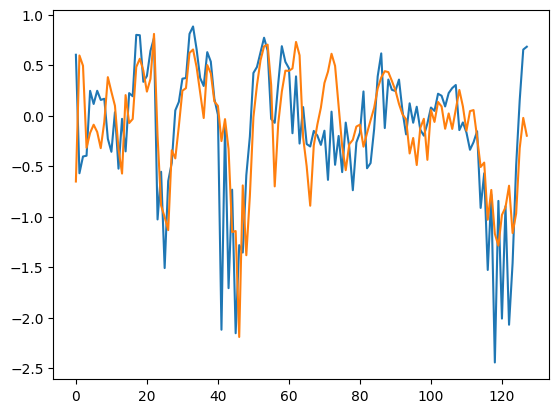

In [50]:
import matplotlib.pyplot as plt
plt.figure()
plt.plot(df_scaled[(df_scaled['Website'] == 8) & (df_scaled['Location'] == 'LOC2')].iloc[:, 2:].values.mean(axis=0))
plt.plot(df_scaled[(df_scaled['Website'] == 8) & (df_scaled['Location'] == 'LOC3')].iloc[:, 2:].values.mean(axis=0))